## <center><ins>Trabajo Práctico 1: Reservas de hotel</ins></center>
#### <center>*Checkpoint 2: Árboles de decisión*</center>
##### <center>75.06 / 95.58 Organización de Datos - FIUBA</center>
##### <center>Ing. Rodríguez - 1°C 2023</center>
---
#### <center>**Grupo 31 - "Datazo":**</center>
<center> Michael Mena - 102685</center>
<center>Pablo Brocca - 104256</center>
<center>Diego Kisinovsky - 106203</center>

---
---

## Carga de datos y librerías

##### Imports:

In [22]:
import pandas as pd
import numpy as np

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk
import dtreeviz.trees as dtreeviz
import pydotplus
from IPython.display import Image

# Modelos y métricas
from sklearn.model_selection import train_test_split, cross_validate, StratifiedKFold, KFold, RandomizedSearchCV
from sklearn.metrics import precision_score, recall_score, accuracy_score,f1_score, make_scorer
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, roc_auc_score, RocCurveDisplay
from sklearn.tree import DecisionTreeClassifier, export_text, export_graphviz, plot_tree
from six import StringIO

# Preprocesamiento
from sklearn.preprocessing import MinMaxScaler

# Manejo de modelos
from pickle import dump
from pickle import load

# Configuración de warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)




##### Lectura del dataset:

In [23]:
hotel_train = pd.read_csv('./dataset/hotels_train_preprocesado.csv')

---

## Armado y entrenamiento del modelo

### Preparación de features:

In [24]:
features = hotel_train.drop(['is_canceled'],axis=1).columns
          
target = 'is_canceled'

features.tolist()

['lead_time',
 'arrival_date_year',
 'arrival_date_month',
 'arrival_date_day_of_month',
 'is_repeated_guest',
 'previous_cancellations',
 'previous_bookings_not_canceled',
 'booking_changes',
 'agent',
 'days_in_waiting_list',
 'adr',
 'required_car_parking_spaces',
 'total_of_special_requests',
 'stays_in_nights',
 'total_of_guests',
 'room_type_unchanged',
 'country_encoded',
 'customer_type_Group',
 'customer_type_Transient',
 'customer_type_Transient-Party',
 'deposit_type_Non Refund',
 'deposit_type_Refundable',
 'hotel_Resort Hotel',
 'distribution_channel_Direct',
 'distribution_channel_GDS',
 'distribution_channel_TA/TO',
 'distribution_channel_Undefined',
 'market_segment_Complementary',
 'market_segment_Corporate',
 'market_segment_Direct',
 'market_segment_Groups',
 'market_segment_Offline TA/TO',
 'market_segment_Online TA',
 'market_segment_Undefined',
 'meal_FB',
 'meal_HB',
 'meal_SC',
 'meal_Undefined']

##### Train-Test Split:

In [25]:
# Separamos un 20% de los datos para test
x_train, x_test, y_train, y_test = train_test_split(hotel_train[features].values, 
                                                    hotel_train[target].values, 
                                                    test_size=0.2,    
                                                    random_state=42,  
                                                    stratify=hotel_train[target].values) 

# Verificamos cantidad de datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

# Verificamos como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48682
# Datos Prueba: 12171
% Positivos Entrenamiento: 50.433
% Positivos Prueba: 50.431


##### CV con Random Search:

In [26]:
#Cantidad de combinaciones
n=10

# Conjunto de parámetros que quiero usar
# 'criterion':['gini','entropy']
params_grid = {'criterion':['gini'],
               'min_samples_leaf':list(range(7,8)),
               'min_samples_split': list(range(4,5)),
               'ccp_alpha':np.linspace(0.000065,0.00007,n), 
               'max_depth':list(range(40,45))}

# Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=10)

# Clasificador
base_tree = DecisionTreeClassifier() 

# Elegimos la metrica a utilizar
scorer_fn = make_scorer(sk.metrics.f1_score)
# scorer_fn = make_scorer(sk.metrics.recall_score)
# scorer_fn = make_scorer(sk.metrics.precision_score)

# Random Search Cross Validation
randomcv = RandomizedSearchCV(estimator=base_tree,
                              param_distributions = params_grid,
                              scoring=scorer_fn,
                              cv=kfoldcv,
                              n_iter=n) 

# Buscamos los hiperparametros que optimizan F1 Score
randomcv.fit(x_train,y_train);

In [27]:
print('Mejores parametros: ', randomcv.best_params_)
print('Mejor score: ', randomcv.best_score_)

Mejores parametros:  {'min_samples_split': 4, 'min_samples_leaf': 7, 'max_depth': 40, 'criterion': 'gini', 'ccp_alpha': 6.833333333333333e-05}
Mejor score:  0.8591642666170621


Elegimos un valor de 10 splits para el KFold ya que mas splits no nos aportaban una mejora significativa en el score, y tambien aumentaban el tiempo de ejecucion.\
A su vez, luego de probar precision y recall, elegimos la metrica F1 Score porque es la que mejor se adapta a nuestro problema, ya que nos interesa minimizar tanto los falsos positivos como los falsos negativos.

In [28]:
# Cada valor representa F1 score, la cantidad varia por el parametro n
randomcv.cv_results_['mean_test_score']

array([0.8587135 , 0.85859374, 0.85861327, 0.85916427, 0.85904558,
       0.85878637, 0.85888583, 0.85875981, 0.85889559, 0.85861419])

#### Creación del árbol con los mejores parámetros:

In [29]:
cv = randomcv

# Se crea un objeto DecisionTreeClassifier con los mejores hiperparámetros encontrados
best_tree = DecisionTreeClassifier(**cv.best_params_)

# Entrenamos el modelo
best_tree.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=6.833333333333333e-05, max_depth=40,
                       min_samples_leaf=7, min_samples_split=4)

##### Gráfico del mejor árbol:

In [30]:
dot_data = StringIO()
export_graphviz(best_tree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features,
                class_names=['No Cancelado','Cancelado'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

Como el árbol es demasiado extenso, graficamos una partición con los primeros 4 niveles:

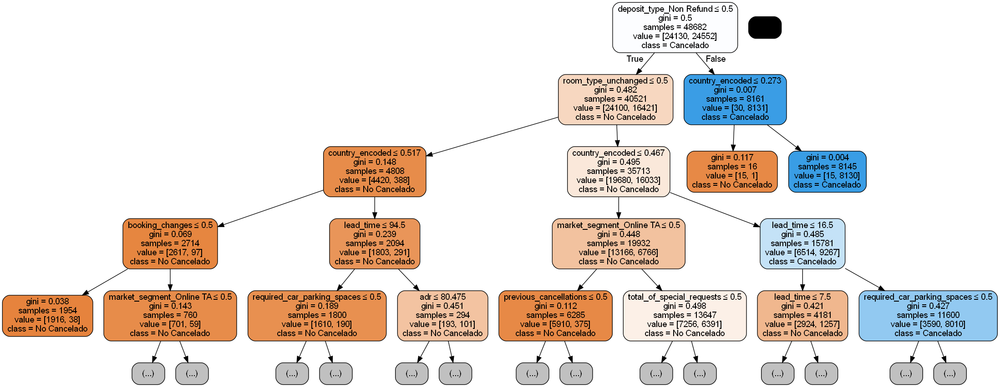

In [31]:
dot_data = StringIO()
export_graphviz(best_tree, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features,
                class_names=['No Cancelado','Cancelado'],
                max_depth=4)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

Viendo las primeras reglas obtenidas del árbol, de los nodos hoja visibles y sus valores de impureza de Gini se pueden extraer algunas conclusiones, entre ellas:\
- Si el depósito es reembolsable (_deposit_type_Non Refund_ <= 0.5), se respetó el tipo de cuarto elegido (_room_type_unchanged_ > 0.5), pasaron 8 o menos días entre la reserva y la llegada estimada al hotel (_lead_time_ <= 8.5), y el cliente no solicitó ninguna cochera (_required_car_parking_spaces_ <= 0.5), el árbol va a predecir con seguridad que la reserva no será cancelada.\
- Si el depósito no es reembolsable (_deposit_type_Non Refund_ > 0.5), el cliente no hizo ningún cambio en su reserva (_booking_changes_ <= 0.5), y no es del tipo Transient-Party (_customer_type_Transient-Party_ <= 0.5), el árbol va a predecir con seguridad que la reserva será cancelada.

---

## Análisis del modelo

##### Algunas definiciones:

- **TP (True Positives):** Cantidad de clasificaciones positivas correctas

- **TN (True Negatives):** Cantidad de clasificaciones negativas correctas

- **FN (False Negatives):** Cantidad de clasificaciones negativas incorrectas

- **FP (False Positives):** Cantidad de clasificaciones positivas incorrectas


#### Reporte de clasificación y matriz de confusión:

- **Precison = TP/TP+FP**\
    Porcentaje de valores clasificados como positivos que son realmente positivos

- **Recall/TPR (True Positive Rate) = TP/TP+FN**\
    Porcentaje de valores positivos que fueron correctamente clasificados

- **FPR (False Positive Rate) = FP/FP+TN**\
    Proporción de casos negativos clasificados como positivos

- **F1 Score = 2 * ( (precision * recall) / (precision + recall) )**\
    Métrica que combina precision y recall para un valor más objetivo

- **Support**\
    Cantidad de ocurrencias de cada clase en el split de test

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      6033
           1       0.86      0.86      0.86      6138

    accuracy                           0.85     12171
   macro avg       0.85      0.85      0.85     12171
weighted avg       0.85      0.85      0.85     12171



Text(37.08333333333333, 0.5, 'True')

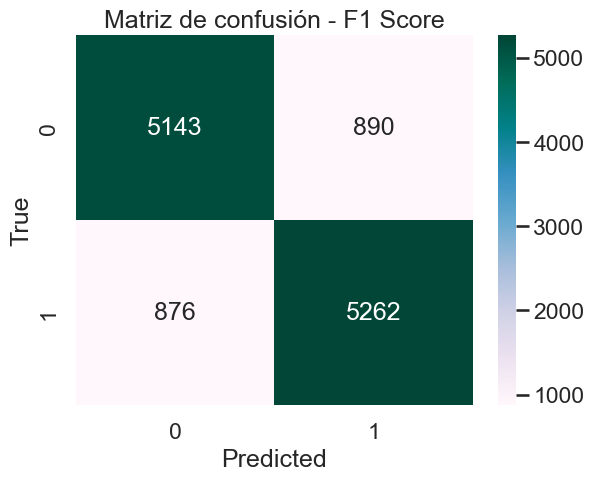

In [41]:
# Hacemos predicción sobre el set de evaluacion
y_pred = best_tree.predict(x_test)

# Reporte y Matriz de Confusion
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, cmap='PuBuGn',annot=True,fmt='g')
plt.title("Matriz de confusión - F1 Score")
plt.xlabel('Predicted')
plt.ylabel('True')

Score de cada split:

In [33]:
results = cross_validate(best_tree, x_train, y_train, cv=kfoldcv,scoring=scorer_fn,return_estimator=True)

metricsCV = results['test_score']
metricsCV

array([0.85656809, 0.85795225, 0.85209982, 0.85906588, 0.86345053,
       0.85639265, 0.86821393, 0.85628019, 0.86272929, 0.85871784])

#### Score de accuracy:

**Accuracy = (TP + TN) / (TP + TN + FP + FN)**\
    Porcentaje total de valores clasificados correctamente

In [34]:
acc = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(acc*100))

Accuracy: 85.49%


#### Gráfico del boxplot para la métrica elegida:

<Axes: >

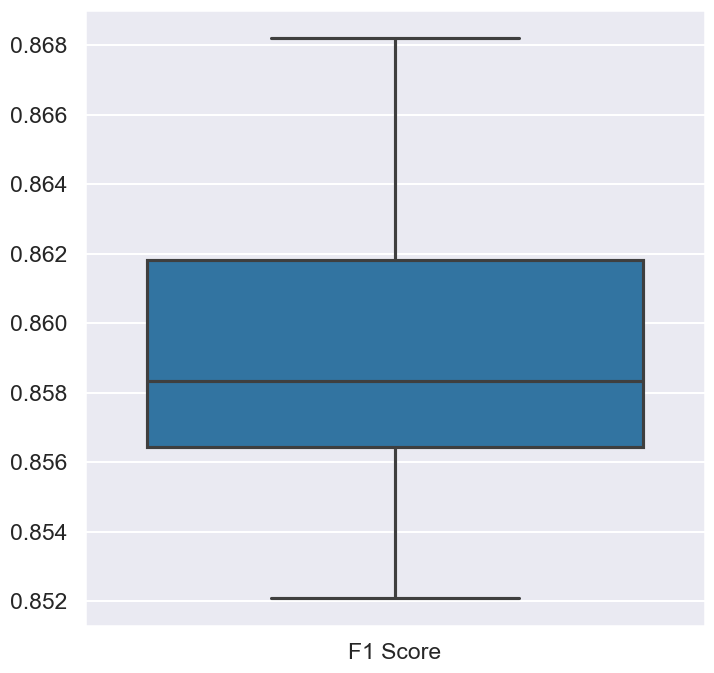

In [35]:
metric_labelsCV = ['F1 Score']*len(metricsCV)
sns.set_context('talk')
sns.set_style("darkgrid")
plt.figure(figsize=(8,8))
sns.boxplot(x=metric_labelsCV, y=metricsCV)

##### Importancia de las reglas del árbol:

In [36]:
feat_imps = best_tree.feature_importances_

for feat_imp,feat in sorted(zip(feat_imps,features)):
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))
print()

reglas = export_text(best_tree, feature_names=list(features))
print(reglas)

distribution_channel_GDS: 0.0002683804915149223
is_repeated_guest: 0.0003244523812801372
meal_SC: 0.0005517729288753985
market_segment_Groups: 0.0005667204879919738
market_segment_Corporate: 0.0006310016571848419
distribution_channel_Direct: 0.0012983360022724788
distribution_channel_TA/TO: 0.0014463219420178038
meal_HB: 0.0014479803672481863
meal_Undefined: 0.0014616175591413163
days_in_waiting_list: 0.0018259125467761008
hotel_Resort Hotel: 0.0021237144150398125
total_of_guests: 0.0022058268194993956
previous_bookings_not_canceled: 0.0024633646611517007
market_segment_Direct: 0.004694153801737736
arrival_date_day_of_month: 0.008109881753501873
stays_in_nights: 0.00892623656357595
customer_type_Transient-Party: 0.01004519152882695
arrival_date_month: 0.01328326406292792
customer_type_Transient: 0.014622356640469573
booking_changes: 0.016592083622728685
previous_cancellations: 0.01736512134287323
adr: 0.027677634979167736
arrival_date_year: 0.0319600124474969
required_car_parking_space

Se observa que las variables que tienen mayor relavancia para decidir si una reserva será cancelada son 'deposit_type_Non Refund' y 'lead_time'. 

#### Gráfico de curva ROC:

- **ROC (Receiver Operating Characteristic)**\
    Gráfico que representa el TPR contra el FPR

- **AUC (Area Under Curve)**\
    Área bajo la curva ROC

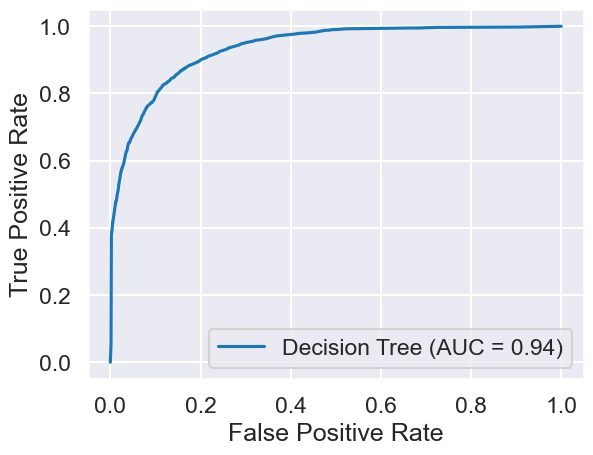

In [37]:
y_pred = best_tree.predict_proba(x_test)[:, 1]  # obtener las probabilidades para la clase positiva
fpr, tpr, _ = roc_curve(y_test, y_pred) # FPR y TPR son acrónimos de "False Positive Rate" y "True Positive Rate"
roc_auc = roc_auc_score(y_test, y_pred)

roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='Decision Tree').plot()
plt.legend(loc="lower right")  # agregar leyenda en la esquina inferior derecha
plt.show()

---

### Exportación del modelo

In [38]:
dump(best_tree, open('./modelos/model_decisiontree_randomcv.pkl', 'wb'))

---